In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import re
from tqdm import tqdm
import numpy as np
import pickle
import pandas as pd
import pymc3 as pm
import datetime
from theano import shared
import theano.tensor as tt
import theano
from pymc3.distributions.dist_math import binomln, betaln, bound
np.set_printoptions(suppress=True)

/Users/ded/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')

In [3]:
# Helper function for visualization
def plot_traces(trcs, varnames=None):
    '''Plot traces with overlaid means and values'''

    nrows = len(trcs.varnames)
    if varnames is not None:
        nrows = len(varnames)

    ax = pm.traceplot(trcs, varnames=varnames, figsize=(12,nrows*1.4),
                      lines={k: v['mean'] for k, v in
                             pm.summary(trcs,varnames=varnames).iterrows()})

    for i, mn in enumerate(pm.summary(trcs, varnames=varnames)['mean']):
        ax[i,0].annotate('{:.2f}'.format(mn), xy=(mn,0), xycoords='data',
                         xytext=(5,10), textcoords='offset points', rotation=90,
                         va='bottom', fontsize='large', color='#AA0022')
def strip_derived_rvs(rvs):
    '''Remove PyMC3-generated RVs from a list'''

    ret_rvs = []
    for rv in rvs:
        if not (re.search('_log',rv.name) or re.search('_interval',rv.name)):
            ret_rvs.append(rv)
    return ret_rvs

In [4]:
# Load the data and process it.

df = pd.read_csv("mturk_surveys.csv.3")
df["hit_answered_date"]=pd.to_datetime(df["hit_answered_date"])
df = df[(df['hit_answered_date']<datetime.datetime(2019, 2, 20))]
df['date'] = pd.to_datetime(df['hit_answered_date'].apply(lambda x : x.date()))

# Calculate the time period of each survey answer. 
# Below we take out time period to be 30-day periods. 
# We can change this to be weeks, months, or anything else
window_length = 30
minDate = min(df['date'])
df['period'] = (df['date'] - minDate).dt.days // window_length 

df = df[(df['period'] < 47)]

# Create a list of all unique worker IDs 
workers = pd.DataFrame(list(set(df.worker_id)), columns=['worker_id']).reset_index().set_index('worker_id')

# Fix the issue of duplicate records within the same period.
data = df[['worker_id', 'period']].drop_duplicates().pivot_table(
    index = 'worker_id',
    values = 'period',                    
    aggfunc=('count','min','max')
).join(workers).set_index('index').sort_index()

# Aggregate the capture histories
data = data.groupby(['min', 'max', 'count']).size().reset_index(name='count_history')

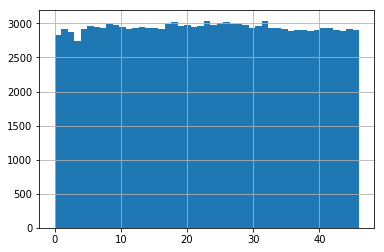

In [5]:
df.period.hist(bins = len(df.period.unique()))

In [6]:
# Summary of input

S = df['period'].max() + 1
V = len(workers)
freqs = data['count_history'].values
H = len(freqs)

print('Sampling periods:', S)
print('Unique patterns:', H)
print('Unique workers:', V)
print(min(df['date']), max(df['date']))

Sampling periods: 47
Unique patterns: 6503
Unique workers: 59551
2015-03-26 00:00:00 2019-02-02 00:00:00


In [7]:
freqs

array([ 894,   55,   53, ..., 1010,  100, 1191])

In [8]:
# We want to see the survival marks to compute the total survival
# e.g, Arrive: 1, Depart: 2 => 011
# Dims: SxSxS
def make_survival(S):
    mask = np.zeros([S,S,S])  # arrival, departure, presence_sequence
    for s in np.arange(S):
        for q in np.arange(s,S):
            c1 = np.zeros(s)
            c2 = np.ones(q-s)
            c3 = np.zeros(S-q)
            mask[s,q]= np.concatenate((c1, c2, c3))
    return mask
survival = tt.constant(make_survival(S))

In [9]:
# A more compact way to represent all Arrival and departures from the data
# This is part of the input data, so we preprocess it!
def get_hmask(S, H, data):
    h_mask = np.zeros((H,S,S))
    for wh in np.arange(H):
        f, l = data['min'].values[wh] , data['max'].values[wh]
        h_mask[wh, :f+1, l:] = 1
    return h_mask
hmask = tt.constant(get_hmask(S, H, data))
hmask.shape

Shape.0

In [10]:
# For a given outcome in {1,S} (Frequency of capture that's not 0) 
# Generate the Binomial parameters n and i   choose(n, i)
# Nn is the duration from arrival to departure
# Ni is the Frequency we are intersted in
# Dim: SxSxS
def make_binmask(S, data):
    i = data['count'].values
    i = i[:, np.newaxis, np.newaxis] *  np.ones((H, S, S))
    n = np.broadcast_to(np.triu(np.ones([S,S]), 0).cumsum(axis =1), (H, S, S))
    return tt.constant(i), tt.constant(n)
Ni, Nn = make_binmask(S, data)
print('Tensor with number of captures', Ni.shape)
print('Tensor with durations from first to last seen', Nn.shape)

Tensor with number of captures Shape.0
Tensor with durations from first to last seen Shape.0


In [11]:
# Helper functions for the Beta Bernoulli Process
# TODO: switch to a single function even for the special case of 0 captures.

def get_BetaBi(a,b, S, Ni, Nn):
    # The beta binomial
    BBi  =  bound(betaln(Ni + a, Nn - Ni + b) - betaln(a, b),
                     Ni >= 0, Ni <= Nn,
                     a > 0, b > 0)
    # The above is the computation of the log, so we take the exponent
    return tt.exp(BBi)

def get_BetaB0(a, b, S):
    # The beta binomial for 0 captures
    Nn = tt.triu(tt.ones([S,S]), 0).cumsum(axis =1).eval()
    #B0 = tt.gammaln(n + b) - tt.gammaln(n + a + b) + tt.gammaln(a + b) - tt.gammaln(b)
    B0 = bound(betaln(a, Nn + b) - betaln(a, b), 
               a > 0, b > 0)
    return tt.exp(B0)

In [12]:
def logp_capture(arrival_probs, departure_probs, a, b, U, survival_mask, Ni, Nn, S, V):
    def ll_capture_f(Nh, data_first_last_mask):
          
        # Likelihood of observing Li captures
        
        # compute the survival
        survival_prob = tt.pow(1 - departure_probs, survival_mask)
        survival_prob = tt.prod(survival_prob, axis=2)
        # compute the arrival and departure
        LAD      = arrival_probs[:, np.newaxis] * survival_prob * departure_probs    # SxS
        # keep only true possibilites
        True_LAD = LAD * data_first_last_mask # SxSxS
        
        # sum along the freqencies of catpures
        BetaBi  = get_BetaBi(a, b, S, Ni, Nn)
        Li      = tt.batched_tensordot(True_LAD, BetaBi, axes = 2) # S
        
        # Likelihood of No-Capture L0
        
        True_LAD0    = LAD * tt.triu(tt.ones((S,S)), 0)
        BetaB0   = get_BetaB0(a, b, S)
        L0       = tt.sum(True_LAD0 * BetaB0)
        
        # Multinomial
        obj1 = tt.gammaln(V + U + 1) - tt.gammaln(U + 1) - tt.sum(tt.gammaln(Nh+1))
        obj2 = tt.sum(Nh * tt.log(Li))
        obj3 = U * tt.log(L0)
        
        objective = obj1 + obj2 + obj3 
        
        return objective
    
    return ll_capture_f

In [13]:
# custom log-liklihood
# model

with pm.Model() as model:
    # parameters
    U = pm.Uniform('Unseen', lower=1, upper=500000)
    #ao = pm.Uniform('alpha-', 0., 100)
    a = 1.
    b = pm.Uniform('beta', 0., 100)
    
    phi = tt.zeros(S)
    phi_v = pm.Uniform('departure', 0, 0.5, shape=S-1)
    phi = tt.set_subtensor(phi[S-1], 1.)
    phi = tt.set_subtensor(phi[:S-1],phi_v)
    
    arr    = pm.Dirichlet('arrival', a=np.concatenate(([.8], np.array([.2/(S-1)]*(S-1))), axis=0), shape=S)
    #U_print = tt.printing.Print('Unseen')(U)
    #a_print = tt.printing.Print('alpha')(a)
    #b_print = tt.printing.Print('beta')(b)
    # Model Log-likelihood
    ob = pm.DensityDist('x', logp_capture(arr, phi, a, b, U, survival, Ni, Nn, S, V), 
                        observed={'Nh': freqs ,
                                  'data_first_last_mask': hmask })

# ADVI Sampling

In [14]:
# "Super fast Sampling" using ADVI
# Loading saved results
with open('trace.p', 'rb') as f:
    saveparam = pickle.load(f)
    
with model:
    s = theano.shared(pm.floatX(1))
    inference = pm.ADVI(cost_part_grad_scale=s)

# load inference
bij = inference.approx.groups[0].bij
inference.approx.params[0].set_value(bij.map(saveparam['mu']))
inference.approx.params[1].set_value(bij.map(saveparam['rho']))

/Users/ded/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:3449: MatplotlibDeprecationWarning: 
The `ymin` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `bottom` instead.
  alternative='`bottom`', obj_type='argument')


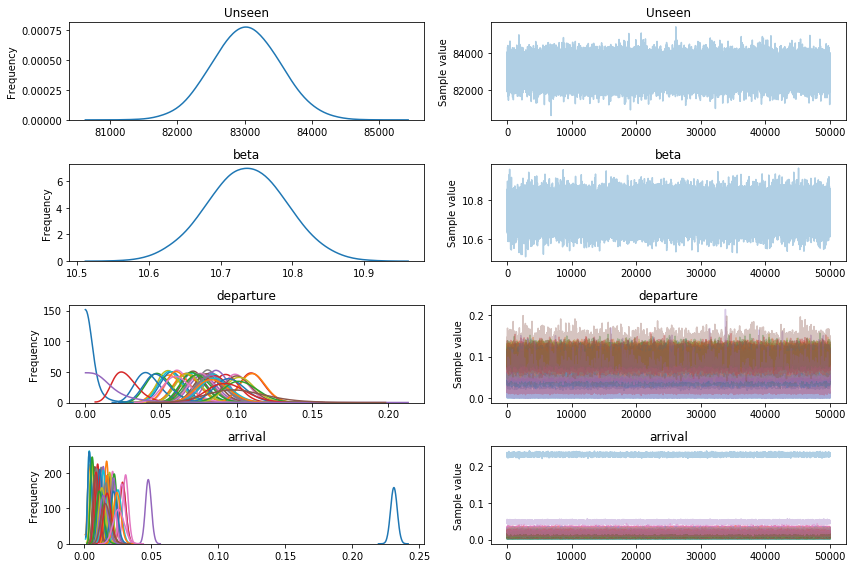

In [15]:
trace_vi = inference.approx.sample(50000)
pm.traceplot(trace_vi);

In [16]:
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')

mpl.rc("figure", figsize=(16, 8))
mpl.rcParams.update({'font.size': 22})
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
sns.set_style("whitegrid")

/Users/ded/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:3449: MatplotlibDeprecationWarning: 
The `ymin` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `bottom` instead.
  alternative='`bottom`', obj_type='argument')
/Users/ded/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:3449: MatplotlibDeprecationWarning: 
The `ymin` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `bottom` instead.
  alternative='`bottom`', obj_type='argument')


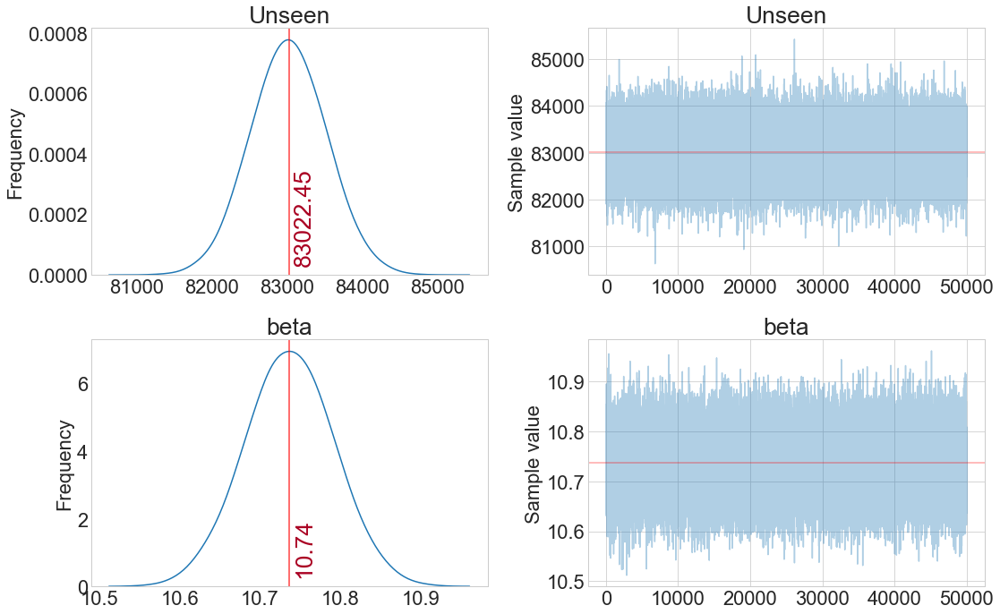

In [17]:
ax = pm.traceplot(trace_vi, varnames=['Unseen', 'beta'], figsize=(16, 2*5),
                  lines={k: v['mean'] for k, v in
                         pm.summary(trace_vi,varnames=['Unseen', 'beta']).iterrows()})


for i, mn in enumerate(pm.summary(trace_vi, varnames=['Unseen', 'beta'])['mean']):
    ax[i,0].annotate('{:.2f}'.format(mn), xy=(mn,0), xycoords='data',
                     xytext=(5,10), textcoords='offset points', rotation=90,
                     va='bottom',fontsize='large', color='#AA0022')

fig = plt.gcf()
fig.savefig('plots/parameters.pdf', bbox_inches='tight')

In [18]:
pm.summary(trace_vi).head(2)

,mean,sd,mc_error,hpd_2.5,hpd_97.5
Unseen,83022.452918,493.912787,2.453091,82072.871530,84006.310509
beta,10.736684,0.055241,0.000272,10.624975,10.841798


In [19]:
def MinMaxNorm(data):
    dataf=((data-data.min())/(data.max()-data.min()))
    return dataf

In [20]:
country_table_time = pd.crosstab(index=df.period, 
                                 columns=df.location_country, 
                                 values='worker_id', 
                                 aggfunc=np.count_nonzero, 
                                 normalize='index')

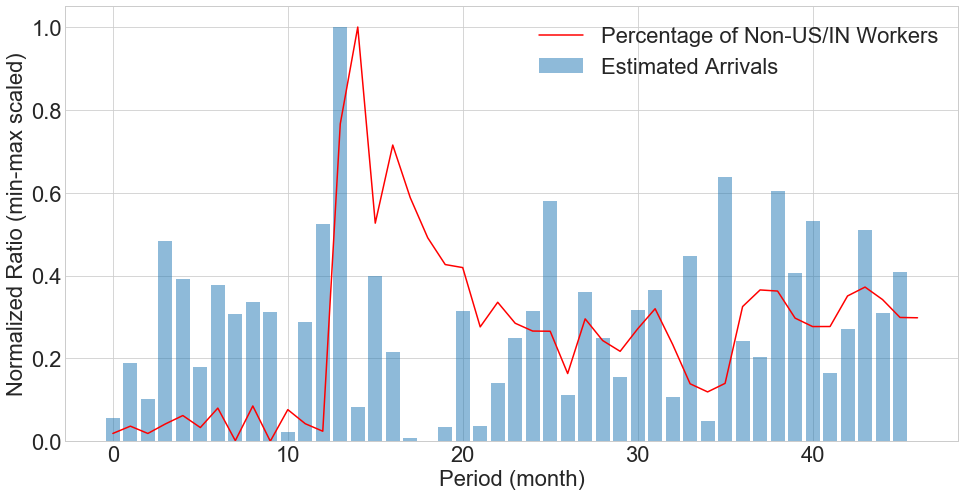

In [21]:
# Percentage of Super-population Arrivals

plt.bar(np.arange(S-1), MinMaxNorm(trace_vi['arrival'][-1][1:]), alpha = 0.5)
MinMaxNorm(country_table_time.drop(['US', 'IN'], axis=1).sum(axis=1)).plot(color = 'red')
#MinMaxNorm(country_table_time[['US', 'IN']].sum(axis=1)).plot(color = 'Teal')
plt.xlabel('Period (month)')
plt.ylabel("Normalized Ratio (min-max scaled)")
plt.legend(['Percentage of Non-US/IN Workers', 'Estimated Arrivals'])
fig.savefig('plots/arrival.pdf', bbox_inches='tight')

In [22]:
U = V + 82967  # Super population
print("Super Population: ", U)
arrivs = trace_vi['arrival'][-1]* U # Arrivals
deps = trace_vi['departure'][-1]* U
deps = np.insert(deps, 0, 0)
noDeps = arrivs.cumsum() 
withDeps = noDeps - deps

Super Population:  142518


In [23]:
prev = 0
h = np.zeros(S)
d = np.insert(trace_vi['departure'][-1], 0, 0)
for i in np.arange(S):
    #print(">>", prev, d[i], arrivs[i])
    current = prev - (prev * d[i]) + arrivs[i] #reduce previous with departed, add arrival
    #print(current)
    prev = current
    h[i] = -(prev * d[i])

<function matplotlib.pyplot.show(*args, **kw)>

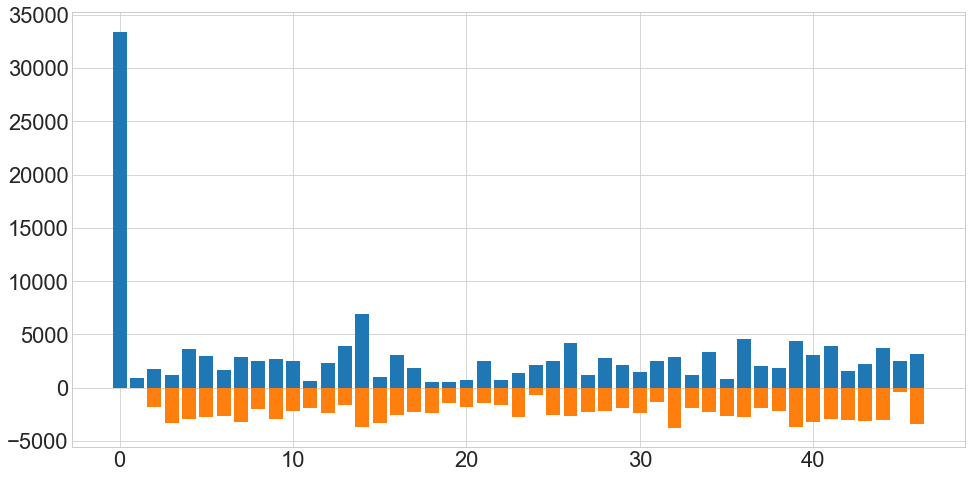

In [24]:
plt.bar(np.arange(S), arrivs)
plt.bar(np.arange(S), h)
plt.show

In [25]:
MinMaxNorm(trace_vi['arrival'][-1][1:])

array([0.05659273, 0.18765496, 0.1019856 , 0.48407661, 0.39150512,
       0.17891642, 0.37649409, 0.30765957, 0.33515596, 0.31166533,
       0.02329693, 0.2868161 , 0.52476472, 1.        , 0.08140416,
       0.39795553, 0.21419442, 0.0069004 , 0.        , 0.03500369,
       0.31493551, 0.03590499, 0.14091675, 0.24990435, 0.31527092,
       0.57949077, 0.11129938, 0.36054609, 0.24968031, 0.15424855,
       0.31710602, 0.36457149, 0.10617276, 0.44681383, 0.04820704,
       0.63838672, 0.2411482 , 0.20262798, 0.60377123, 0.40615926,
       0.53284821, 0.16586449, 0.27028498, 0.50884944, 0.30954293,
       0.40955121])

In [26]:
country_table_time[['US', 'IN', 'DZ']]

location_country,US,IN,DZ
period,,,
0,0.754336,0.206726,0.000000
1,0.803626,0.154294,0.000000
2,0.811262,0.149809,0.000000
3,0.797228,0.159737,0.000000
4,0.800618,0.152711,0.000000
5,0.811467,0.147049,0.000000
6,0.814727,0.135392,0.000000
7,0.814802,0.149386,0.000000
8,0.780749,0.168449,0.000000


In [27]:
trace_vi['arrival'][-1][1:].sum()

0.7658716167752602

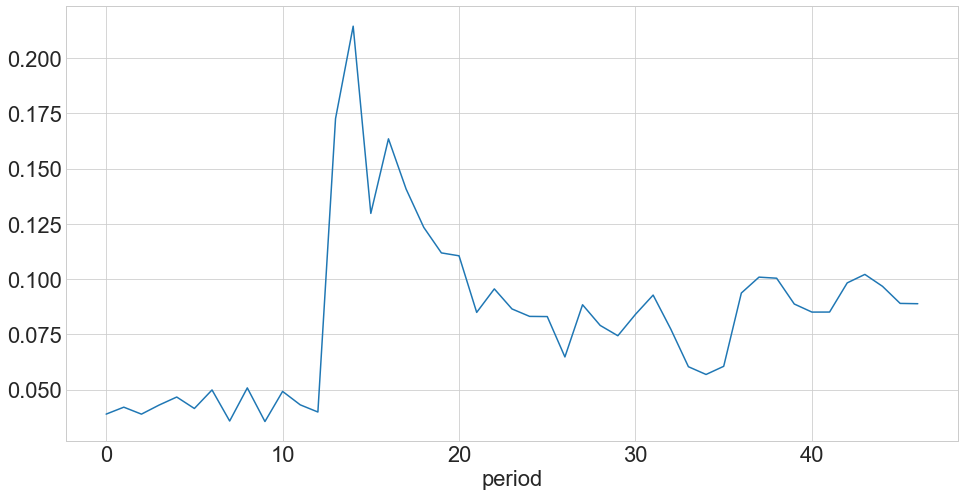

In [28]:
country_table_time.drop(['US','IN'], axis=1).sum(axis = 1).plot()

/Users/ded/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6499: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


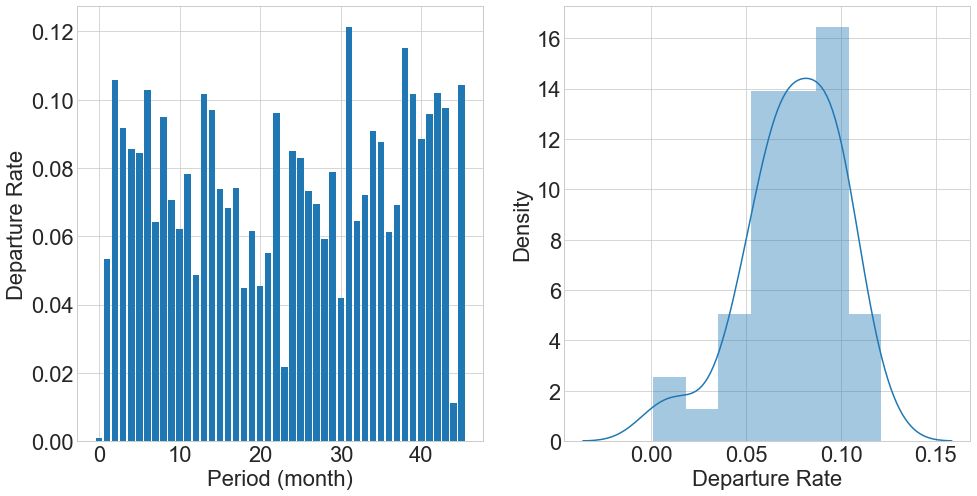

In [29]:
fig = plt.figure()
fig.add_subplot(1, 2, 1)   #top and bottom left
plt.bar(np.arange(S-1), trace_vi['departure'][-1])
plt.xlabel("Period (month)")
plt.ylabel("Departure Rate")
fig.add_subplot(1, 2, 2)   #top right
sns.distplot(trace_vi['departure'][-1])
plt.xlabel("Departure Rate")
plt.ylabel("Density")
plt.show()
#fig.savefig("plots/departure.pdf', bbox_inches='tight')